
# Description	du	projet
L’objectif	 de	 ce	 projet	 est	 de	 prédire	 le	 parti	 politique	 gagnant	 des	 élections	
présidentielles	de	2020	aux	États-Unis	à	partir	de	données	socio-démographiques.

# 1. Constituer	les	données

In [2]:
# # Installer la bibliothèque xlrd pour lire les fichiers excel de type "xls"
# !pip install xlrd

# # Installer la bibliothèque shap pour réaliser l'analyse locale des variables
# !pip install shap

In [3]:
# Importation des bibliothèques nécessaires
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from sklearn.impute import SimpleImputer
from sklearn.decomposition import PCA
from sklearn.feature_selection import RFECV
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score
from sklearn.linear_model import LogisticRegression
from sklearn import svm
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import roc_curve, auc
from sklearn.inspection import permutation_importance
from sklearn.metrics import classification_report

In [4]:
# Charger les donnees
resultat_2020=pd.read_csv("data/2020_US_County_Level_Presidential_Results.csv")
historique_presidentielle=pd.read_csv("data/US_County_Level_Presidential_Results_08-16.csv")
education=pd.read_excel("data/Education.xls", sheet_name="Education 1970 to 2019")
population=pd.read_excel("data/PopulationEstimates.xls", sheet_name="Population Estimates 2010-19")
chomage=pd.read_excel("data/Unemployment.xls", sheet_name="Unemployment Med HH Income")
pauvrete=pd.read_excel("data/PovertyEstimates.xls", sheet_name="Poverty Data 2019")

# Création de la target

In [5]:
# Affichez les dimensions du jeu de données resultat_2020
print(f"Le jeu de données a {resultat_2020.shape[0]} lignes et {resultat_2020.shape[1]} colonnes")

# Affichez les 5 premières lignes
resultat_2020.head(5)

Le jeu de données a 3152 lignes et 10 colonnes


,state_name,county_fips,county_name,votes_gop,votes_dem,total_votes,diff,per_gop,per_dem,per_point_diff
0,Alabama,1001,Autauga County,19838,7503,27770,12335,0.714368,0.270184,0.444184
1,Alabama,1003,Baldwin County,83544,24578,109679,58966,0.761714,0.224090,0.537623
2,Alabama,1005,Barbour County,5622,4816,10518,806,0.534512,0.457882,0.076631
3,Alabama,1007,Bibb County,7525,1986,9595,5539,0.784263,0.206983,0.577280
4,Alabama,1009,Blount County,24711,2640,27588,22071,0.895716,0.095694,0.800022


In [6]:
#afficher les info du dataset
resultat_2020.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3152 entries, 0 to 3151
Data columns (total 10 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   state_name      3152 non-null   object 
 1   county_fips     3152 non-null   int64  
 2   county_name     3152 non-null   object 
 3   votes_gop       3152 non-null   int64  
 4   votes_dem       3152 non-null   int64  
 5   total_votes     3152 non-null   int64  
 6   diff            3152 non-null   int64  
 7   per_gop         3152 non-null   float64
 8   per_dem         3152 non-null   float64
 9   per_point_diff  3152 non-null   float64
dtypes: float64(3), int64(5), object(2)
memory usage: 246.4+ KB


In [7]:
# verification valeur manquante
resultat_2020.isna().any()

state_name        False
county_fips       False
county_name       False
votes_gop         False
votes_dem         False
total_votes       False
diff              False
per_gop           False
per_dem           False
per_point_diff    False
dtype: bool

In [8]:
# verification de valeur dupliquée
resultat_2020.duplicated().any()

False

In [9]:
#fonction pour creer la variable cible en fonction du pourcentage de chaque partie
def recodage(x, y):
    if x>y:
        return 1
    else:
        return 0

0	Pour le	Parti Démocrate<br>
1	pour le	Parti Républicain

In [10]:
#création de la variable cible
Target= pd.DataFrame(resultat_2020.apply(lambda row: recodage(row["votes_dem"], row["votes_gop"]), axis=1), columns=["Target"])

#  ajout de la variable "country_fips"
Target["county_fips"]= resultat_2020["county_fips"]

# afficher le dataset
Target

,Target,county_fips
0,0,1001
1,0,1003
2,0,1005
3,0,1007
4,0,1009
...,...,...
3147,0,56037
3148,1,56039
3149,0,56041
3150,0,56043


# Création du dataframe exploitable "data"

# Education

In [11]:
# Renommer la colonne 'colonne_initiale' en 'nouveau_nom_colonne'
education = education.rename(columns={'FIPS Code': 'county_fips'})

# Affichez les dimensions du jeu de données education
print(f"Le jeu de données a {education.shape[0]} lignes et {education.shape[1]} colonnes")

# Affichez les 5 premières lignes
education.head()

Le jeu de données a 3283 lignes et 47 colonnes


,county_fips,State,Area name,2003 Rural-urban Continuum Code,2003 Urban Influence Code,2013 Rural-urban Continuum Code,2013 Urban Influence Code,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970",...,"Percent of adults completing some college or associate's degree, 2000","Percent of adults with a bachelor's degree or higher, 2000","Less than a high school diploma, 2015-19","High school diploma only, 2015-19","Some college or associate's degree, 2015-19","Bachelor's degree or higher, 2015-19","Percent of adults with less than a high school diploma, 2015-19","Percent of adults with a high school diploma only, 2015-19","Percent of adults completing some college or associate's degree, 2015-19","Percent of adults with a bachelor's degree or higher, 2015-19"
0,0,US,United States,NaN,NaN,NaN,NaN,52373312.0,34158051.0,11650730.0,...,27.4,24.4,26472261.0,59472748.0,63756905.0,70920162.0,11.998918,26.956844,28.898697,32.145542
1,1000,AL,Alabama,NaN,NaN,NaN,NaN,1062306.0,468269.0,136287.0,...,25.9,19.0,458922.0,1022839.0,993344.0,845772.0,13.819302,30.800268,29.912098,25.468332
2,1001,AL,Autauga County,2.0,2.0,2.0,2.0,6611.0,3757.0,933.0,...,26.9,18.0,4291.0,12551.0,10596.0,9929.0,11.483395,33.588459,28.356571,26.571573
3,1003,AL,Baldwin County,4.0,5.0,3.0,2.0,18726.0,8426.0,2334.0,...,29.3,23.1,13893.0,41797.0,47274.0,48148.0,9.193843,27.659616,31.284081,31.862459
4,1005,AL,Barbour County,6.0,6.0,6.0,6.0,8120.0,2242.0,581.0,...,21.3,10.9,4812.0,6396.0,4676.0,2080.0,26.786907,35.604542,26.029837,11.578713


# Population

In [12]:
# Renommer la colonne 'colonne_initiale' en 'nouveau_nom_colonne'
population = population.rename(columns={'FIPStxt': 'county_fips'})

# Affichez les dimensions du jeu de données resultat_2020
print(f"Le jeu de données a {population.shape[0]} lignes et {population.shape[1]} colonnes")

# Affichez les 5 premières lignes
population.head(5)

Le jeu de données a 3273 lignes et 165 colonnes


,county_fips,State,Area_Name,Rural-urban_Continuum Code_2003,Rural-urban_Continuum Code_2013,Urban_Influence_Code_2003,Urban_Influence_Code_2013,Economic_typology_2015,CENSUS_2010_POP,ESTIMATES_BASE_2010,...,R_DOMESTIC_MIG_2019,R_NET_MIG_2011,R_NET_MIG_2012,R_NET_MIG_2013,R_NET_MIG_2014,R_NET_MIG_2015,R_NET_MIG_2016,R_NET_MIG_2017,R_NET_MIG_2018,R_NET_MIG_2019
0,0,US,United States,NaN,NaN,NaN,NaN,NaN,308745538,308758105,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1000,AL,Alabama,NaN,NaN,NaN,NaN,NaN,4779736,4780125,...,1.917501,0.578434,1.186314,1.522549,0.563489,0.626357,0.745172,1.090366,1.773786,2.483744
2,1001,AL,Autauga County,2.0,2.0,2.0,2.0,0.0,54571,54597,...,4.847310,6.018182,-6.226119,-3.902226,1.970443,-1.712875,4.777171,0.849656,0.540916,4.560062
3,1003,AL,Baldwin County,4.0,3.0,5.0,2.0,5.0,182265,182265,...,24.017829,16.641870,17.488579,22.751474,20.184334,17.725964,21.279291,22.398256,24.727215,24.380567
4,1005,AL,Barbour County,6.0,6.0,6.0,6.0,3.0,27457,27455,...,-5.690302,0.292676,-6.897817,-8.132185,-5.140431,-15.724575,-18.238016,-24.998528,-8.754922,-5.165664


# Chômage

In [13]:
# Renommer la colonne 'colonne_initiale' en 'nouveau_nom_colonne'
chomage = chomage.rename(columns={'fips_txt': 'county_fips'})

# Affichez les dimensions du jeu de données 
print(f"Le jeu de données a {chomage.shape[0]} lignes et {chomage.shape[1]} colonnes")

# Affichez les 5 premières lignes
chomage.head()

Le jeu de données a 3275 lignes et 88 colonnes


,county_fips,Stabr,area_name,Rural_urban_continuum_code_2013,Urban_influence_code_2013,Metro_2013,Civilian_labor_force_2000,Employed_2000,Unemployed_2000,Unemployment_rate_2000,...,Civilian_labor_force_2018,Employed_2018,Unemployed_2018,Unemployment_rate_2018,Civilian_labor_force_2019,Employed_2019,Unemployed_2019,Unemployment_rate_2019,Median_Household_Income_2019,Med_HH_Income_Percent_of_State_Total_2019
0,0,US,United States,NaN,NaN,NaN,142601667.0,136904680.0,5696987.0,3.995035,...,161389026.0,155102319.0,6286707.0,3.895375,163100055.0,157115247.0,5984808.0,3.669409,65712.0,NaN
1,1000,AL,Alabama,NaN,NaN,NaN,2133223.0,2035594.0,97629.0,4.600000,...,2216627.0,2130845.0,85782.0,3.900000,2241747.0,2174483.0,67264.0,3.000000,51771.0,100.000000
2,1001,AL,"Autauga County, AL",2.0,2.0,1.0,21720.0,20846.0,874.0,4.000000,...,26196.0,25261.0,935.0,3.600000,26172.0,25458.0,714.0,2.700000,58233.0,112.481888
3,1003,AL,"Baldwin County, AL",3.0,2.0,1.0,69533.0,66971.0,2562.0,3.700000,...,95233.0,91809.0,3424.0,3.600000,97328.0,94675.0,2653.0,2.700000,59871.0,115.645828
4,1005,AL,"Barbour County, AL",6.0,6.0,0.0,11373.0,10748.0,625.0,5.500000,...,8414.0,7987.0,427.0,5.100000,8537.0,8213.0,324.0,3.800000,35972.0,69.482918


# Pauvrete

In [14]:
# Renommer la colonne 'colonne_initiale' en 'nouveau_nom_colonne'
pauvrete = pauvrete.rename(columns={'FIPStxt': 'county_fips'})

# Affichez les dimensions du jeu de données resultat_2020
print(f"Le jeu de données a {pauvrete.shape[0]} lignes et {pauvrete.shape[1]} colonnes")

# Affichez les 5 premières lignes
pauvrete.head()

Le jeu de données a 3193 lignes et 34 colonnes


,county_fips,Stabr,Area_name,Rural-urban_Continuum_Code_2003,Urban_Influence_Code_2003,Rural-urban_Continuum_Code_2013,Urban_Influence_Code_2013,POVALL_2019,CI90LBALL_2019,CI90UBALL_2019,...,CI90UB517P_2019,MEDHHINC_2019,CI90LBINC_2019,CI90UBINC_2019,POV04_2019,CI90LB04_2019,CI90UB04_2019,PCTPOV04_2019,CI90LB04P_2019,CI90UB04P_2019
0,0,US,United States,NaN,NaN,NaN,NaN,39490096,39248096,39732096,...,16.0,65712,65594,65830,3457689.0,3405854.0,3509524.0,18.2,17.9,18.5
1,1000,AL,Alabama,NaN,NaN,NaN,NaN,747478,730491,764465,...,21.6,51771,51179,52363,69236.0,65296.0,73176.0,24.2,22.8,25.6
2,1001,AL,Autauga County,2.0,2.0,2.0,2.0,6723,5517,7929,...,19.4,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN
3,1003,AL,Baldwin County,4.0,5.0,3.0,2.0,22360,18541,26179,...,17.2,59871,54593,65149,NaN,NaN,NaN,NaN,NaN,NaN
4,1005,AL,Barbour County,6.0,6.0,6.0,6.0,5909,4787,7031,...,49.0,35972,31822,40122,NaN,NaN,NaN,NaN,NaN,NaN


# data

In [15]:
# Concaténation des datasets en se basant sur la colonne 'county_fips'
data = pd.merge(education, population, on='county_fips')
data = pd.merge(data, chomage, on='county_fips')
data = pd.merge(data, pauvrete, on='county_fips')
data = pd.merge(data, Target, on='county_fips')

In [16]:
# Réinitialisation de l'index
data=data.reset_index(drop=True)

# Affichez les dimensions du jeu de données 
print(f"Le jeu de données a {data.shape[0]} lignes et {data.shape[1]} colonnes")

# Affichez les 5 premières lignes
data.head()

Le jeu de données a 3112 lignes et 332 colonnes


,county_fips,State_x,Area name,2003 Rural-urban Continuum Code,2003 Urban Influence Code,2013 Rural-urban Continuum Code,2013 Urban Influence Code,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970",...,MEDHHINC_2019,CI90LBINC_2019,CI90UBINC_2019,POV04_2019,CI90LB04_2019,CI90UB04_2019,PCTPOV04_2019,CI90LB04P_2019,CI90UB04P_2019,Target
0,1001,AL,Autauga County,2.0,2.0,2.0,2.0,6611.0,3757.0,933.0,...,58233,52517,63949,NaN,NaN,NaN,NaN,NaN,NaN,0
1,1003,AL,Baldwin County,4.0,5.0,3.0,2.0,18726.0,8426.0,2334.0,...,59871,54593,65149,NaN,NaN,NaN,NaN,NaN,NaN,0
2,1005,AL,Barbour County,6.0,6.0,6.0,6.0,8120.0,2242.0,581.0,...,35972,31822,40122,NaN,NaN,NaN,NaN,NaN,NaN,0
3,1007,AL,Bibb County,1.0,1.0,1.0,1.0,5272.0,1402.0,238.0,...,47918,42291,53545,NaN,NaN,NaN,NaN,NaN,NaN,0
4,1009,AL,Blount County,1.0,1.0,1.0,1.0,10677.0,3440.0,626.0,...,52902,46777,59027,NaN,NaN,NaN,NaN,NaN,NaN,0


# 

#  2. Analyse Exploratoire 

In [17]:
#afficher les info du dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3112 entries, 0 to 3111
Columns: 332 entries, county_fips to Target
dtypes: float64(298), int64(26), object(8)
memory usage: 7.9+ MB


In [18]:
# voir le pourcentage de valeur manquante pour chaque variable
data.isna().sum()/len(data)*100

county_fips                          0.0
State_x                              0.0
Area name                            0.0
2003 Rural-urban Continuum Code      0.0
2003 Urban Influence Code            0.0
                                   ...  
CI90UB04_2019                      100.0
PCTPOV04_2019                      100.0
CI90LB04P_2019                     100.0
CI90UB04P_2019                     100.0
Target                               0.0
Length: 332, dtype: float64

In [19]:
# fonction pour obtenir la liste des variables ayant beaucoup de valeurs manquantes
def variables_manquantes(dataset, seuil):
    """
    Cette fonction parcourt un dataset et renvoie une liste des variables
    ayant un pourcentage de valeurs manquantes supérieur au seuil spécifié.
    
    Args:
    - dataset (DataFrame): Le dataset à analyser.
    - seuil (float): Le seuil de pourcentage de valeurs manquantes à partir duquel
                    une variable est considérée comme ayant beaucoup de valeurs manquantes.
                    
    Returns:
    - list: Une liste des noms de variables ayant beaucoup de valeurs manquantes.
    """
    variables_manquantes = []
    total_lignes = len(dataset)
    
    for colonne in dataset.columns:
        nb_valeurs_manquantes = dataset[colonne].isnull().sum()
        pourcentage_manquant = (nb_valeurs_manquantes / total_lignes) * 100
        
        if pourcentage_manquant > seuil:
            variables_manquantes.append(colonne)
    
    return variables_manquantes

# Appeler la fonction pour obtenir la liste des variables ayant beaucoup de valeurs manquantes
variables_manquantes_liste = variables_manquantes(data, 50)

# Afficher la liste des variables ayant beaucoup de valeurs manquantes
print("Variables avec beaucoup de valeurs manquantes : ", variables_manquantes_liste)

Variables avec beaucoup de valeurs manquantes :  ['POV04_2019', 'CI90LB04_2019', 'CI90UB04_2019', 'PCTPOV04_2019', 'CI90LB04P_2019', 'CI90UB04P_2019']


In [20]:
#suppression des colonnes ayant trop de valeur manquante
data.drop(variables_manquantes_liste,axis=1, inplace=True)
print(f"Le jeu de données a désormais {data.shape[0]} lignes et {data.shape[1]} colonnes")

Le jeu de données a désormais 3112 lignes et 326 colonnes


In [21]:
# Sélectionner uniquement les colonnes numériques
numeric_columns = data.select_dtypes(include=np.number)

# Initialisation de l'imputeur pour les valeurs numériques
imp_mean = SimpleImputer(missing_values=np.nan, strategy='median')

# Imputation sur les valeurs numériques
data[numeric_columns.columns] = imp_mean.fit_transform(numeric_columns)

In [22]:
#verification de valeur dupliquée
data.duplicated().any()

False

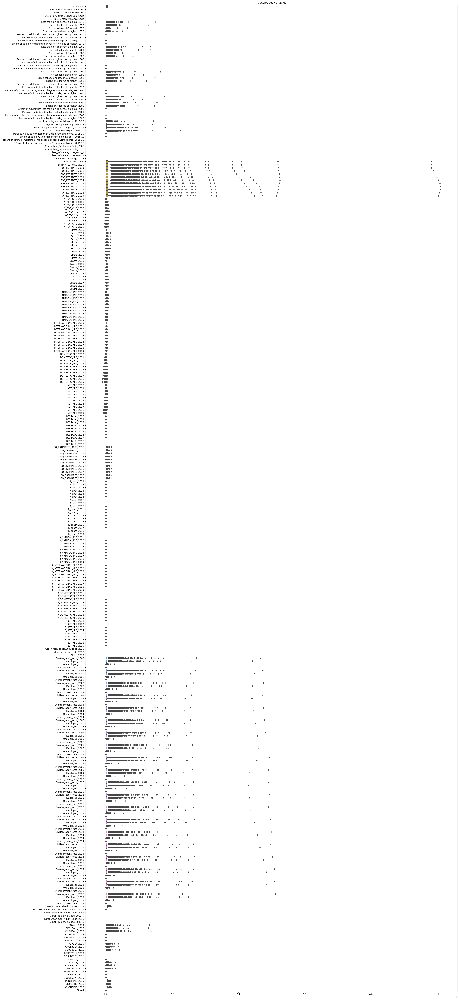

In [23]:
#création d'un mask pour selectionner les colonne numerique de mon dataset
mask = data.select_dtypes(exclude="object")

# Afficher un boxplot des variables pour detecter visuellement la presence d'un outlier
plt.figure(figsize=(30, 80))
sns.boxplot(data=mask, orient='h')
plt.title(' boxplot des variables')
plt.show()

In [24]:
# fontion pour voir les outliers dans un DataFrame
def show_possible_outliers(df, column):
    """
    Détecte les outliers dans une colonne numérique d'un DataFrame selon la méthode de l'IQR.

    Inputs :
    --------
    - df : DataFrame
    - column : Nom de la colonne numérique (str)

    Outputs :
    ---------
    Renvoie la liste des index des possibles outliers ainsi que les limite basse et haute

    """

    # 1er Quartile
    Q1 = np.nanpercentile(df[column], 25)

    # 3ème Quartile
    Q3 = np.nanpercentile(df[column], 75)

    # Inter-Quartile Range (IQR)
    IQR = Q3 - Q1

    # limites, basse & haute
    outer_fence = IQR * 1.5
    outer_lower = Q1 - outer_fence
    outer_upper = Q3 + outer_fence

    # Détection des outliers potentiels
    mask = (df[column] < outer_lower) | (df[column] > outer_upper)

    # Stockage de leurs indices
    possible_outlier_index = df[mask].index

    # Passage sous forme de list
    outliers_index = possible_outlier_index.tolist()

    return sorted(outliers_index), outer_lower, outer_upper

# Appel de la fonction pour détecter les outliers dans une colonne specifique
outliers_index, outer_lower, outer_upper = show_possible_outliers(data, "Less than a high school diploma, 1970")

# Définir l'option pour afficher toutes les colonnes
pd.set_option('display.max_columns', None)

# Afficher le DataFrame avec avec les index des valeurs aberrantes 
print(f"Le DataFrame avec les valeurs aberrantes d'une colonne specifique  :")
data.loc[outliers_index].head()

Le DataFrame avec les valeurs aberrantes d'une colonne specifique  :


,county_fips,State_x,Area name,2003 Rural-urban Continuum Code,2003 Urban Influence Code,2013 Rural-urban Continuum Code,2013 Urban Influence Code,"Less than a high school diploma, 1970","High school diploma only, 1970","Some college (1-3 years), 1970","Four years of college or higher, 1970","Percent of adults with less than a high school diploma, 1970","Percent of adults with a high school diploma only, 1970","Percent of adults completing some college (1-3 years), 1970","Percent of adults completing four years of college or higher, 1970","Less than a high school diploma, 1980","High school diploma only, 1980","Some college (1-3 years), 1980","Four years of college or higher, 1980","Percent of adults with less than a high school diploma, 1980","Percent of adults with a high school diploma only, 1980","Percent of adults completing some college (1-3 years), 1980","Percent of adults completing four years of college or higher, 1980","Less than a high school diploma, 1990","High school diploma only, 1990","Some college or associate's degree, 1990","Bachelor's degree or higher, 1990","Percent of adults with less than a high school diploma, 1990","Percent of adults with a high school diploma only, 1990","Percent of adults completing some college or associate's degree, 1990","Percent of adults with a bachelor's degree or higher, 1990","Less than a high school diploma, 2000","High school diploma only, 2000","Some college or associate's degree, 2000","Bachelor's degree or higher, 2000","Percent of adults with less than a high school diploma, 2000","Percent of adults with a high school diploma only, 2000","Percent of adults completing some college or associate's degree, 2000","Percent of adults with a bachelor's degree or higher, 2000","Less than a high school diploma, 2015-19","High school diploma only, 2015-19","Some college or associate's degree, 2015-19","Bachelor's degree or higher, 2015-19","Percent of adults with less than a high school diploma, 2015-19","Percent of adults with a high school diploma only, 2015-19","Percent of adults completing some college or associate's degree, 2015-19","Percent of adults with a bachelor's degree or higher, 2015-19",State_y,Area_Name,Rural-urban_Continuum Code_2003,Rural-urban_Continuum Code_2013,Urban_Influence_Code_2003_x,Urban_Influence_Code_2013_x,Economic_typology_2015,CENSUS_2010_POP,ESTIMATES_BASE_2010,POP_ESTIMATE_2010,POP_ESTIMATE_2011,POP_ESTIMATE_2012,POP_ESTIMATE_2013,POP_ESTIMATE_2014,POP_ESTIMATE_2015,POP_ESTIMATE_2016,POP_ESTIMATE_2017,POP_ESTIMATE_2018,POP_ESTIMATE_2019,N_POP_CHG_2010,N_POP_CHG_2011,N_POP_CHG_2012,N_POP_CHG_2013,N_POP_CHG_2014,N_POP_CHG_2015,N_POP_CHG_2016,N_POP_CHG_2017,N_POP_CHG_2018,N_POP_CHG_2019,Births_2010,Births_2011,Births_2012,Births_2013,Births_2014,Births_2015,Births_2016,Births_2017,Births_2018,Births_2019,Deaths_2010,Deaths_2011,Deaths_2012,Deaths_2013,Deaths_2014,Deaths_2015,Deaths_2016,Deaths_2017,Deaths_2018,Deaths_2019,NATURAL_INC_2010,NATURAL_INC_2011,NATURAL_INC_2012,NATURAL_INC_2013,NATURAL_INC_2014,NATURAL_INC_2015,NATURAL_INC_2016,NATURAL_INC_2017,NATURAL_INC_2018,NATURAL_INC_2019,INTERNATIONAL_MIG_2010,INTERNATIONAL_MIG_2011,INTERNATIONAL_MIG_2012,INTERNATIONAL_MIG_2013,INTERNATIONAL_MIG_2014,INTERNATIONAL_MIG_2015,INTERNATIONAL_MIG_2016,INTERNATIONAL_MIG_2017,INTERNATIONAL_MIG_2018,INTERNATIONAL_MIG_2019,DOMESTIC_MIG_2010,DOMESTIC_MIG_2011,DOMESTIC_MIG_2012,DOMESTIC_MIG_2013,DOMESTIC_MIG_2014,DOMESTIC_MIG_2015,DOMESTIC_MIG_2016,DOMESTIC_MIG_2017,DOMESTIC_MIG_2018,DOMESTIC_MIG_2019,NET_MIG_2010,NET_MIG_2011,NET_MIG_2012,NET_MIG_2013,NET_MIG_2014,NET_MIG_2015,NET_MIG_2016,NET_MIG_2017,NET_MIG_2018,NET_MIG_2019,RESIDUAL_2010,RESIDUAL_2011,RESIDUAL_2012,RESIDUAL_2013,RESIDUAL_2014,RESIDUAL_2015,RESIDUAL_2016,RESIDUAL_2017,RESIDUAL_2018,RESIDUAL_2019,GQ_ESTIMATES_BASE_2010,GQ_ESTIMATES_2010,GQ_ESTIMATES_2011,GQ_ESTIMATES_2012,GQ_ESTIMATES_2013,GQ_ESTIMATES_2014,GQ_ESTIMATES_2015,GQ_ESTIMATES_2016,GQ_ESTIMATES_2017,GQ_ESTIMATES_2018,GQ_ESTIMATES_

In [25]:
# fontion pour les remplacer par les limites haute ou basse de la plage interquartile
def replace_possible_outliers(df, target_column):
    """
    Détecte les outliers dans chaque colonne numérique d'un DataFrame selon la méthode de l'IQR
    et les remplace par les limites haute ou basse de la plage interquartile.

    Inputs :
    --------
    - df : DataFrame
        Le DataFrame contenant les données, y compris la variable cible.
    - target_column : str
        Le nom de la colonne représentant la variable cible.

    Outputs :
    ---------
    Modifie le DataFrame en place.
    """
    for column in df.select_dtypes(include=np.number).columns:  
        # Ignorer la colonne de la variable cible
        if column == target_column:
            continue
        
        # Calcul des quartiles et de l'IQR
        Q1 = np.nanpercentile(df[column], 25)
        Q3 = np.nanpercentile(df[column], 75)
        IQR = Q3 - Q1

        # Calcul des limites haute et basse
        outer_fence = IQR * 1.5
        outer_lower = Q1 - outer_fence
        outer_upper = Q3 + outer_fence

        # Détection des outliers potentiels
        mask = (df[column] < outer_lower) | (df[column] > outer_upper)

        # Remplacement des outliers par les limites de l'IQR
        df.loc[mask, column] = np.where(df.loc[mask, column] > outer_upper, outer_upper, outer_lower)

# Traiter les outliers
replace_possible_outliers(data, "Target")

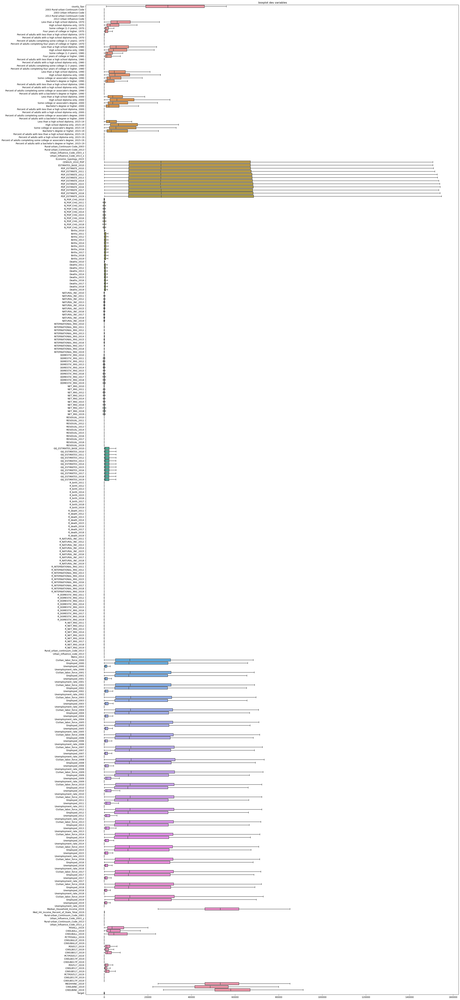

In [26]:
#création d'un mask pour selectionner les colonne numerique de mon dataset
mask = data.select_dtypes(exclude="object")

# Afficher un boxplot des variables pour detecter visuellement la presence d'un outlier
plt.figure(figsize=(30, 80))
sns.boxplot(data=mask, orient='h')
plt.title(' boxplot des variables')
plt.show()

In [27]:
# voir les variables catégorielles
mask = data.select_dtypes(include="object")
mask

,State_x,Area name,State_y,Area_Name,Stabr_x,area_name,Stabr_y,Area_name
0,AL,Autauga County,AL,Autauga County,AL,"Autauga County, AL",AL,Autauga County
1,AL,Baldwin County,AL,Baldwin County,AL,"Baldwin County, AL",AL,Baldwin County
2,AL,Barbour County,AL,Barbour County,AL,"Barbour County, AL",AL,Barbour County
3,AL,Bibb County,AL,Bibb County,AL,"Bibb County, AL",AL,Bibb County
4,AL,Blount County,AL,Blount County,AL,"Blount County, AL",AL,Blount County
...,...,...,...,...,...,...,...,...
3107,WY,Sweetwater County,WY,Sweetwater County,WY,"Sweetwater County, WY",WY,Sweetwater County
3108,WY,Teton County,WY,Teton County,WY,"Teton County, WY",WY,Teton County
3109,WY,Uinta County,WY,Uinta County,WY,"Uinta County, WY",WY,Uinta County
3110,WY,Washakie County,WY,Washakie County,WY,"Washakie County, WY",WY,Washakie County


In [28]:
#  supprimer les variables dupliquées
data.drop(["State_y","Area_Name","Stabr_x","area_name","Stabr_y","Area_name"], axis=1, inplace= True)

In [29]:
#fonction qui permet d'encoder toutes les variables catégorielles du DataFrame en faisant du label encoding
def encodage_df(x):
    for i in x.select_dtypes(include=["object"]).columns:
        x[i],_=pd.factorize(x[i])
        return encodage_df(x)

#afficher le nouveau dataset
encodage_df(data)

In [30]:
# Séparer les features et la cible
y = data["Target"]
X = data.drop("Target", axis=1)

In [31]:
# Initialisez le scaler pour standardisez nos variables
sc = StandardScaler()

# Normalisez les données avec la méthode fit_transform
X_normalise = sc.fit_transform(X)

# Contrôlez les dimension de X_normalise
print(f"Les dimensions de nos données centrées réduites : {X_normalise.shape}")

Les dimensions de nos données centrées réduites : (3112, 319)


# Implementer une ACP pour reduire la dimensionalité

In [32]:
# Réduction de dimensionnalité avec l'ACP
pca = PCA(0.90)
education_pca = pca.fit_transform(X_normalise)

In [33]:
# Affichage de la variance expliquée par chaque composante
explained_variance_ratio = pca.explained_variance_ratio_
print(f'Variance expliquée par les composantes principales : {explained_variance_ratio}')

Variance expliquée par les composantes principales : [0.49030714 0.10563136 0.06874754 0.05183324 0.02958843 0.02305642
 0.02080234 0.01349825 0.01197089 0.01158013 0.01038573 0.00898663
 0.00872313 0.00745133 0.00671932 0.00554828 0.00534259 0.00505536
 0.00484105 0.00471656 0.00439242 0.0040719 ]


In [34]:
# On affiche le cumul de la variance expliquée
for i in range(len(pca.explained_variance_ratio_)):
    if i == 0 :
        print(f"Le premier axe explique {sum(pca.explained_variance_ratio_[:i+1])*100:.2f}% de la variance totale")
    else :
        print(f"Les {i+1} premiers axe expliquent {sum(pca.explained_variance_ratio_[:i+1])*100:.2f}% de la variance totale")

Le premier axe explique 49.03% de la variance totale
Les 2 premiers axe expliquent 59.59% de la variance totale
Les 3 premiers axe expliquent 66.47% de la variance totale
Les 4 premiers axe expliquent 71.65% de la variance totale
Les 5 premiers axe expliquent 74.61% de la variance totale
Les 6 premiers axe expliquent 76.92% de la variance totale
Les 7 premiers axe expliquent 79.00% de la variance totale
Les 8 premiers axe expliquent 80.35% de la variance totale
Les 9 premiers axe expliquent 81.54% de la variance totale
Les 10 premiers axe expliquent 82.70% de la variance totale
Les 11 premiers axe expliquent 83.74% de la variance totale
Les 12 premiers axe expliquent 84.64% de la variance totale
Les 13 premiers axe expliquent 85.51% de la variance totale
Les 14 premiers axe expliquent 86.26% de la variance totale
Les 15 premiers axe expliquent 86.93% de la variance totale
Les 16 premiers axe expliquent 87.48% de la variance totale
Les 17 premiers axe expliquent 88.02% de la variance to

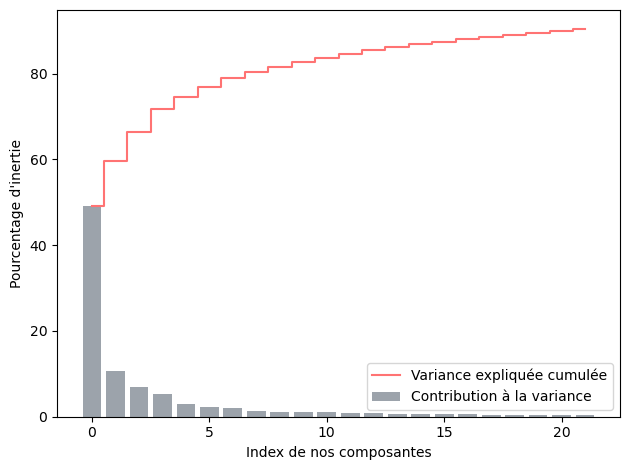

In [35]:
# On stocke la contribution des valeurs propres
exp_var_pca = pca.explained_variance_ratio_*100

# On calcule la somme cumulée des valeurs propres
cum_sum_eigenvalues = np.cumsum(exp_var_pca)

# Visualiser la contribution des composantes
plt.bar(range(0,len(exp_var_pca)), exp_var_pca, alpha=0.5, align='center', color="#3b4859", label='Contribution à la variance')
plt.step(range(0,len(cum_sum_eigenvalues)), cum_sum_eigenvalues, c='#ff7373', where='mid',label='Variance expliquée cumulée')
plt.ylabel("Pourcentage d'inertie")
plt.xlabel('Index de nos composantes')
plt.legend(loc='best')
plt.tight_layout()
plt.show()

In [36]:
# Extraction des charges des variables pour chaque composante
loadings = pca.components_.T

In [37]:
# Affichage des charges des variables
loadings_df = pd.DataFrame(loadings, columns=[f'PC{i}' for i in range(1, pca.n_components_ + 1)], index=X.columns)
print('Charges des variables pour chaque composante principale:')
print(loadings_df)

Charges des variables pour chaque composante principale:
                                      PC1       PC2       PC3       PC4  \
county_fips                     -0.001663  0.019645 -0.006769  0.005787   
State_x                         -0.001350  0.018677 -0.007443  0.005454   
Area name                       -0.000057  0.018420  0.013312  0.003054   
2003 Rural-urban Continuum Code -0.059006  0.001097  0.021406  0.017422   
2003 Urban Influence Code       -0.052702  0.004409  0.033858  0.025513   
...                                   ...       ...       ...       ...   
CI90LB517P_2019                 -0.015150 -0.128463  0.030369 -0.086595   
CI90UB517P_2019                 -0.032119 -0.118766  0.024873 -0.087386   
MEDHHINC_2019                    0.042618  0.110472 -0.014535  0.039022   
CI90LBINC_2019                   0.047394  0.103026 -0.015598  0.039361   
CI90UBINC_2019                   0.037768  0.116223 -0.013473  0.038311   

                                      PC5 

In [38]:
# Identification des variables réduites
variables_reduites = X.columns[np.argmax(np.abs(loadings), axis=0)]
print('Variables réduites :', variables_reduites)

Variables réduites : Index(['Civilian_labor_force_2017', 'Unemployment_rate_2014', 'R_birth_2016',
       'Percent of adults with a high school diploma only, 1970',
       '2013 Urban Influence Code', 'R_birth_2016',
       'Percent of adults completing some college or associate's degree, 2000',
       'RESIDUAL_2016', 'R_DOMESTIC_MIG_2012', 'RESIDUAL_2016',
       'Percent of adults completing some college (1-3 years), 1970',
       'Percent of adults with a high school diploma only, 1990', 'State_x',
       'R_DOMESTIC_MIG_2013', 'county_fips', 'R_DOMESTIC_MIG_2012',
       'R_DOMESTIC_MIG_2011', 'NET_MIG_2010', 'R_NET_MIG_2016',
       'R_NET_MIG_2014', 'NET_MIG_2010', 'R_NET_MIG_2015'],
      dtype='object')


In [39]:
# Afficher les features avec les variables réduites
X=X[variables_reduites]
print(f"Le jeu de données a {X.shape[0]} lignes et {X.shape[1]} colonnes")

# Affichez les 5 premières lignes
X.head()

Le jeu de données a 3112 lignes et 22 colonnes


,Civilian_labor_force_2017,Unemployment_rate_2014,R_birth_2016,"Percent of adults with a high school diploma only, 1970",2013 Urban Influence Code,R_birth_2016,"Percent of adults completing some college or associate's degree, 2000",RESIDUAL_2016,R_DOMESTIC_MIG_2012,RESIDUAL_2016,"Percent of adults completing some college (1-3 years), 1970","Percent of adults with a high school diploma only, 1990",State_x,R_DOMESTIC_MIG_2013,county_fips,R_DOMESTIC_MIG_2012,R_DOMESTIC_MIG_2011,NET_MIG_2010,R_NET_MIG_2016,R_NET_MIG_2014,NET_MIG_2010,R_NET_MIG_2015
0,26075.000,5.8,12.097324,31.1,2.0,12.097324,26.9,-3.0,-5.971992,-3.0,7.7,32.0,0,-4.121042,1001.0,-5.971992,5.945455,123.5,4.777171,1.970443,123.5,-1.712875
1,71882.375,6.1,11.204755,26.7,2.0,11.204755,29.3,5.5,16.219674,5.5,7.4,31.8,0,18.006050,1003.0,16.219674,15.684259,123.5,21.279291,20.115574,123.5,17.725964
2,8349.000,10.5,10.597247,19.0,6.0,10.597247,21.3,2.0,-6.457531,2.0,4.9,27.1,0,-7.762540,1005.0,-6.457531,0.475598,-70.0,-18.238016,-5.140431,-70.0,-15.724575
3,8583.000,7.2,12.225372,19.4,1.0,12.225372,20.4,1.0,-4.624328,1.0,3.3,33.8,0,-6.683190,1007.0,-4.624328,-5.436808,-59.0,-0.708717,1.331144,-59.0,1.329817
4,24822.000,6.1,12.171796,22.7,1.0,12.171796,24.8,-2.0,-1.737016,-2.0,4.1,34.7,0,-1.128482,1009.0,-1.737016,0.487228,7.0,-1.391062,-2.049590,7.0,-1.338525


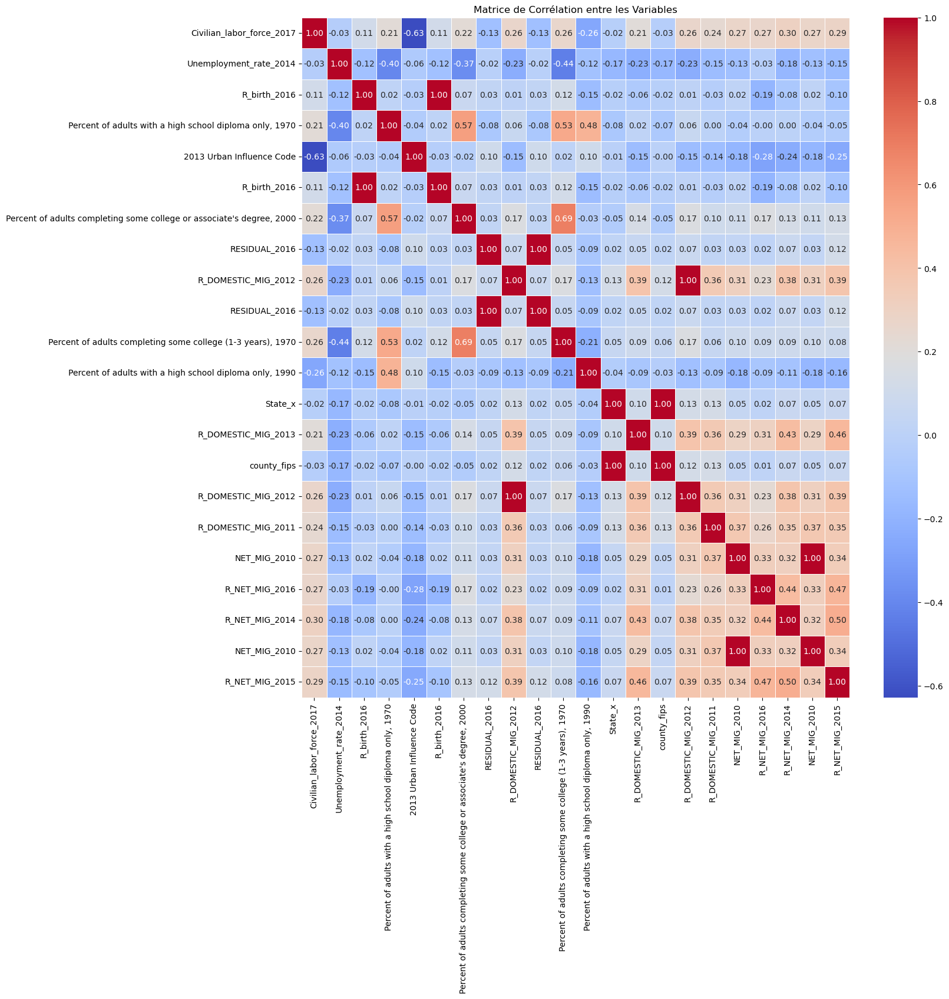

In [40]:
 # Calcul de la matrice de corrélation entre les variables
correlation_matrix = X.corr()

# Graphique de matrice de corrélation
plt.figure(figsize=(15,15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Matrice de Corrélation entre les Variables')
plt.show()

In [41]:
# Vérifier les variables dupliquées
duplicated_variables = X.columns[X.columns.duplicated()]

if len(duplicated_variables) > 0:
    print("Variables dupliquées trouvées:")
    print(duplicated_variables)
else:
    print("Aucune variable dupliquée trouvée.")

Variables dupliquées trouvées:
Index(['R_birth_2016', 'RESIDUAL_2016', 'R_DOMESTIC_MIG_2012', 'NET_MIG_2010'], dtype='object')


In [42]:
# supprimer les variables dupliquées
X.drop(duplicated_variables, axis=1, inplace=True)

In [43]:
 # Calcul de la matrice de corrélation entre les variables
correlation_matrix = X.corr()

# Afficher les paires de variables fortement corrélées
threshold = 0.8  # Choisissez le seuil de corrélation
correlated_pairs = []

for i in range(len(correlation_matrix.columns)):
    for j in range(i+1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            pair = (correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j])
            correlated_pairs.append(pair)

if len(correlated_pairs) > 0:
    print("Paires de variables fortement corrélées:")
    for pair in correlated_pairs:
        print(f"{pair[0]} et {pair[1]} : {pair[2]}")
else:
    print("Aucune paire de variables fortement corrélées trouvée avec un seuil de corrélation de", threshold)


Paires de variables fortement corrélées:
State_x et county_fips : 0.9992542465269411


In [44]:
# supprimer la colonne "State_x"
X.drop(["State_x"],axis=1, inplace=True)
print("variable supprimer avec succes")

variable supprimer avec succes


# Implementation RFE

In [45]:
# split des données en train et test
set_seed = 1204
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=set_seed)

In [46]:
# Définir et instancier le classifieur à entraîner (ici, une régression logistique)
estimator = LogisticRegression(random_state=set_seed)

# Instanciation de la RFECV()
rfecv_selector = RFECV(estimator=estimator,
                       min_features_to_select=10,
                       scoring='f1',
                       n_jobs=-1,
                       step=1,
                       cv=5
                      )

# Entraînez le modèle
rfecv_selector.fit(X_train, y_train)


RFECV(cv=5, estimator=LogisticRegression(random_state=1204),
      min_features_to_select=10, n_jobs=-1, scoring='f1')

In [47]:
# Représentation graphique AUC en fonction du nombre de variables, après RFECV.
mean_test_roc_auc = rfecv_selector.cv_results_["mean_test_score"]
n_features_selected = rfecv_selector.n_features_
min_features_to_select = rfecv_selector.min_features_to_select
n_features_in_rfecv = rfecv_selector.n_features_in_

fig = px.line(y=mean_test_roc_auc,
              x=range(min_features_to_select, min_features_to_select + len(mean_test_roc_auc)),
              labels={
                     "x": "Nombre de variables sélectionnées",
                     "y": "Score moyen de cross-validation"
              },
              title=f"Résultats RFECV avec {rfecv_selector.cv} k-fold"
             )
fig.add_vline(x=n_features_selected, line_width=3, line_dash="dash", line_color="#3b4859")
fig.add_vrect(x0=30, x1=n_features_in_rfecv, line_width=0, fillcolor="#ff7373", opacity=0.2)
fig.show()


In [48]:
# Récupérez l'ensemble des variables issues de RFECV et transformer là en liste
rfe_features = rfecv_selector.get_feature_names_out().tolist()
print(f"Variables sélectionnées avec une performance élevée: :\n{rfe_features}\n")

Variables sélectionnées avec une performance élevée: :
['Civilian_labor_force_2017', 'Unemployment_rate_2014', 'Percent of adults with a high school diploma only, 1970', '2013 Urban Influence Code', "Percent of adults completing some college or associate's degree, 2000", 'Percent of adults completing some college (1-3 years), 1970', 'Percent of adults with a high school diploma only, 1990', 'R_DOMESTIC_MIG_2013', 'R_DOMESTIC_MIG_2011', 'R_NET_MIG_2016', 'R_NET_MIG_2014', 'R_NET_MIG_2015']



In [49]:
# Afficher les Variables pré-sélecttionnées
X=X[rfe_features]
print(f"Le jeu de données a {X.shape[0]} lignes et {X.shape[1]} colonnes")

# Affichez les 5 premières lignes
X.head()

Le jeu de données a 3112 lignes et 12 colonnes


,Civilian_labor_force_2017,Unemployment_rate_2014,"Percent of adults with a high school diploma only, 1970",2013 Urban Influence Code,"Percent of adults completing some college or associate's degree, 2000","Percent of adults completing some college (1-3 years), 1970","Percent of adults with a high school diploma only, 1990",R_DOMESTIC_MIG_2013,R_DOMESTIC_MIG_2011,R_NET_MIG_2016,R_NET_MIG_2014,R_NET_MIG_2015
0,26075.000,5.8,31.1,2.0,26.9,7.7,32.0,-4.121042,5.945455,4.777171,1.970443,-1.712875
1,71882.375,6.1,26.7,2.0,29.3,7.4,31.8,18.006050,15.684259,21.279291,20.115574,17.725964
2,8349.000,10.5,19.0,6.0,21.3,4.9,27.1,-7.762540,0.475598,-18.238016,-5.140431,-15.724575
3,8583.000,7.2,19.4,1.0,20.4,3.3,33.8,-6.683190,-5.436808,-0.708717,1.331144,1.329817
4,24822.000,6.1,22.7,1.0,24.8,4.1,34.7,-1.128482,0.487228,-1.391062,-2.049590,-1.338525


In [50]:
#  voir la description statistique pour le sous ensemble de donnees
X.describe()

,Civilian_labor_force_2017,Unemployment_rate_2014,"Percent of adults with a high school diploma only, 1970",2013 Urban Influence Code,"Percent of adults completing some college or associate's degree, 2000","Percent of adults completing some college (1-3 years), 1970","Percent of adults with a high school diploma only, 1990",R_DOMESTIC_MIG_2013,R_DOMESTIC_MIG_2011,R_NET_MIG_2016,R_NET_MIG_2014,R_NET_MIG_2015
count,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000,3112.000000
mean,22923.228591,6.179242,28.409030,5.224293,26.127988,8.903583,34.300739,-1.733496,-1.850067,-0.101350,-0.904376,-0.561907
std,24293.472284,2.099572,8.122363,3.472972,5.627673,3.552670,6.118798,8.630109,7.732892,10.504784,8.949476,9.550746
min,100.000000,1.200000,5.800000,1.000000,10.100000,0.000000,18.000000,-21.516192,-19.562411,-24.510364,-22.024474,-22.544480
25%,5003.000000,4.600000,21.900000,2.000000,22.100000,6.100000,30.300000,-6.695351,-6.246028,-6.231558,-6.221956,-6.005191
50%,11653.500000,6.000000,29.400000,5.000000,26.200000,8.600000,33.800000,-1.954317,-1.842191,-0.673901,-1.153278,-1.007086
75%,31754.750000,7.500000,35.000000,8.000000,30.100000,11.200000,38.500000,3.185209,2.631560,5.954312,4.313056,5.021001
max,71882.375000,11.850000,47.900000,12.000000,42.100000,18.850000,50.800000,18.006050,15.947943,24.233118,20.115574,21.560290


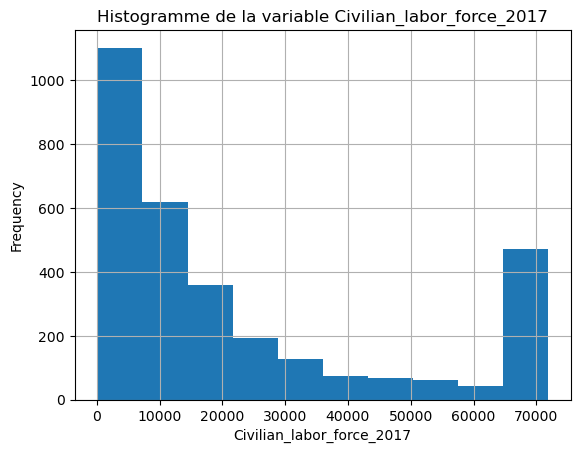

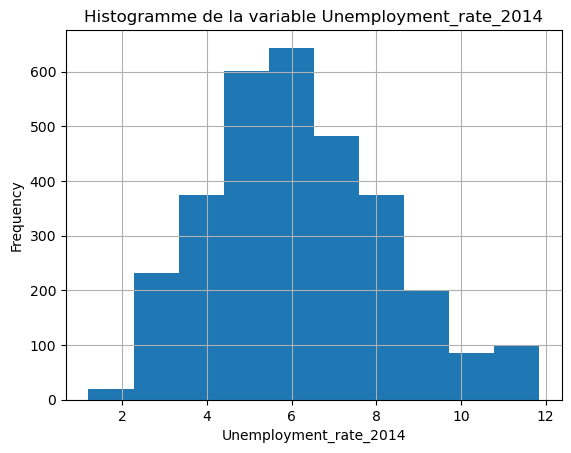

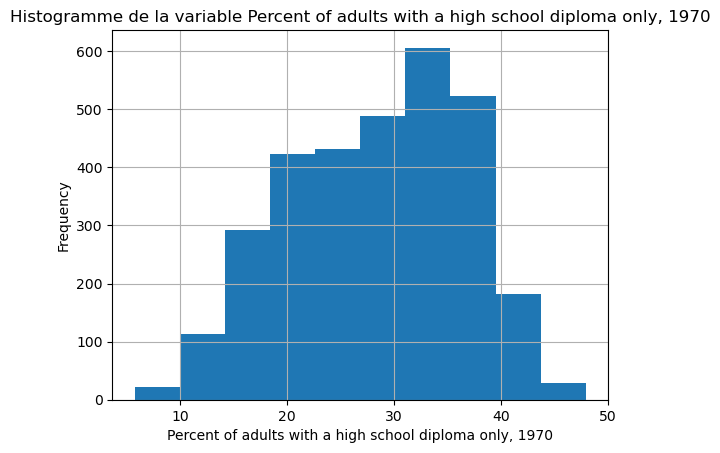

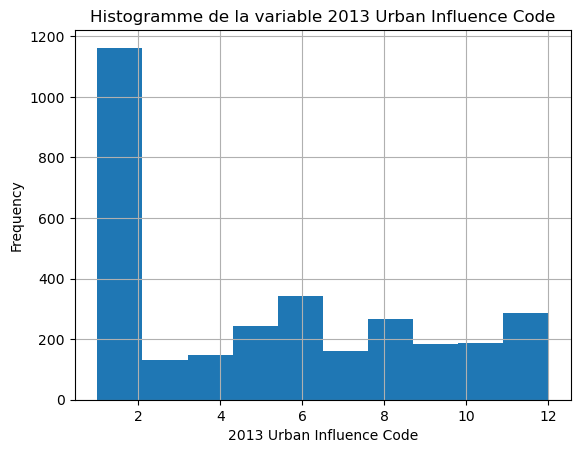

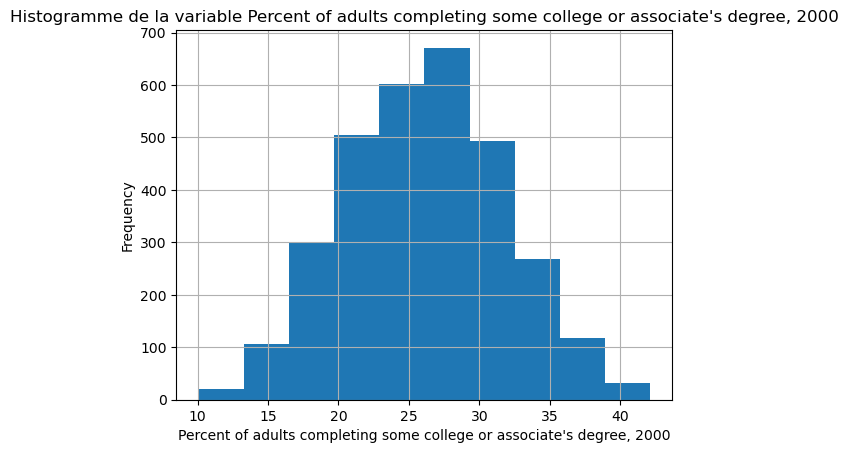

...

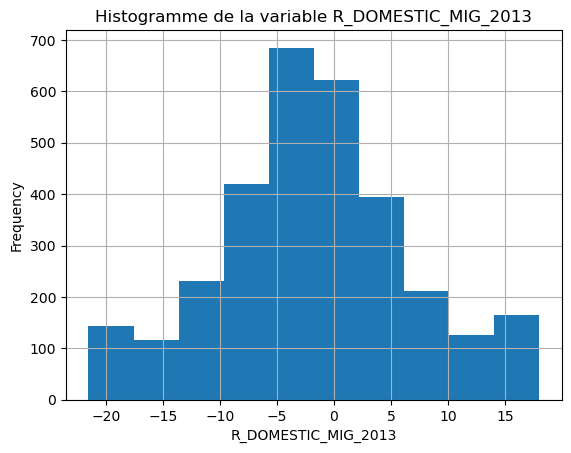

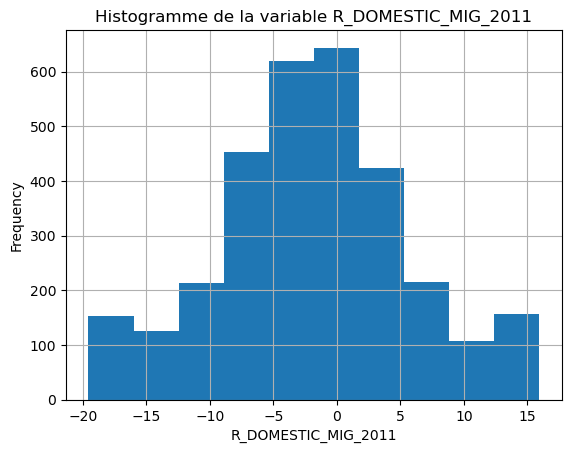

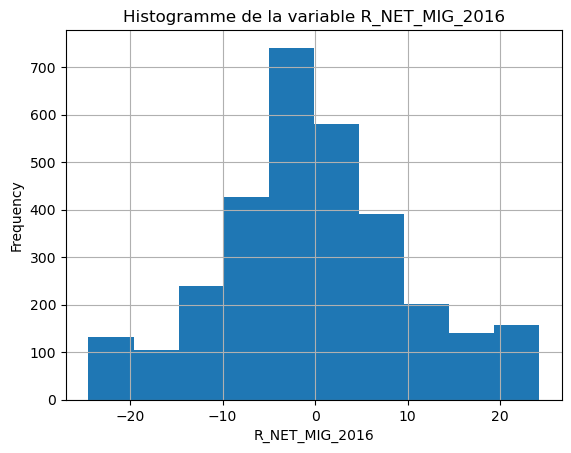

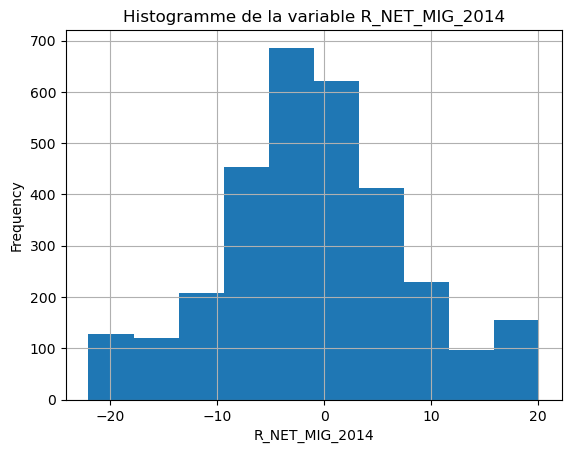

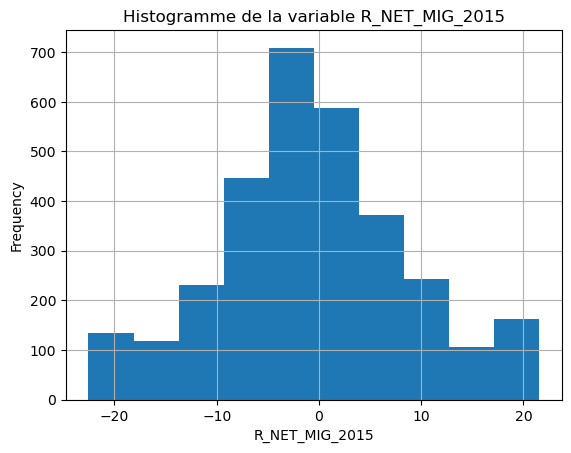

In [51]:
#afficher la representation graphique de toutes les variables quantitative
quantitative_columns=X.select_dtypes(exclude=object).columns
for var in quantitative_columns:
    X[var].hist()
    plt.title('Histogramme de la variable ' + var )
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.show()

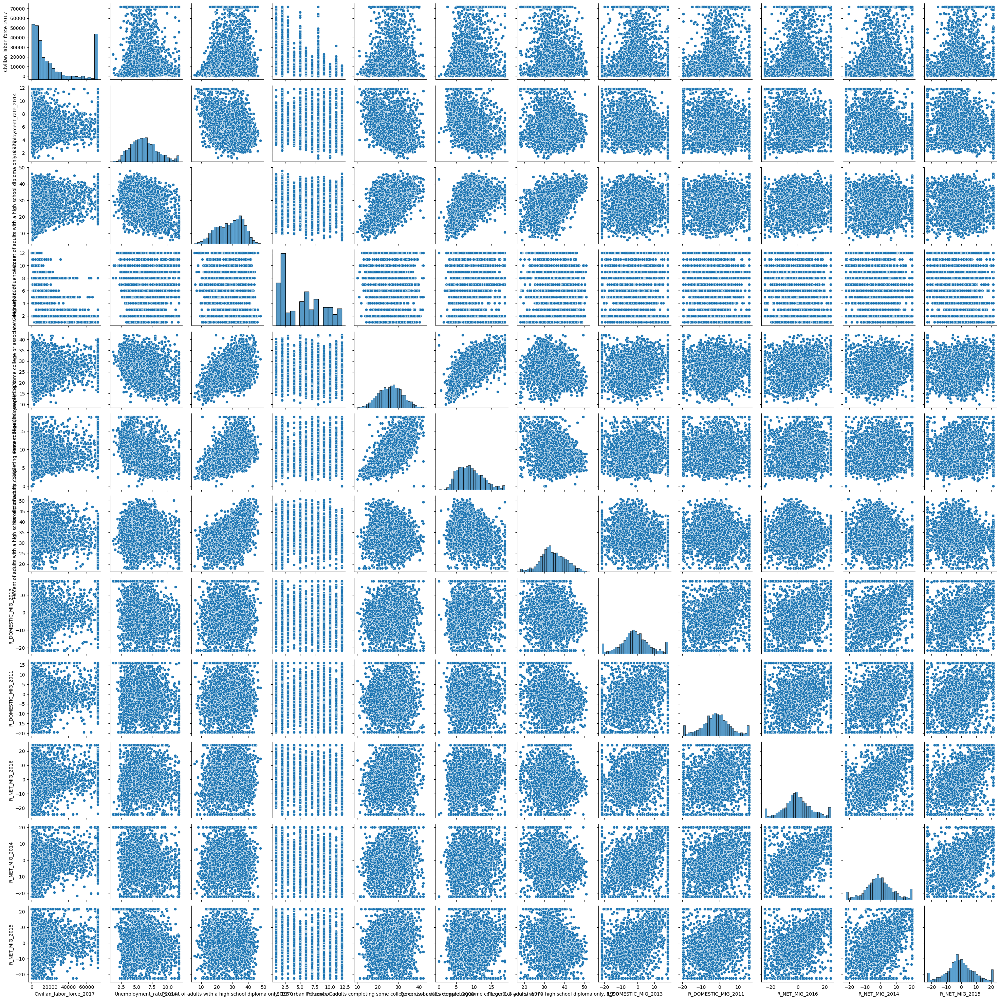

In [52]:
# Afficher les graphiques deux à deux
sns.pairplot(X)
plt.show()

# Comparons les resultats des éléctions de 2008 à 2016 à ceux de 2020


In [53]:
# Affichez les dimensions du jeu de données historique_presidentielle
print(f"Le jeu de données a {historique_presidentielle.shape[0]} lignes et {historique_presidentielle.shape[1]} colonnes")

# Affichez les 5 premières lignes
historique_presidentielle.head()

Le jeu de données a 3112 lignes et 14 colonnes


,fips_code,county,total_2008,dem_2008,gop_2008,oth_2008,total_2012,dem_2012,gop_2012,oth_2012,total_2016,dem_2016,gop_2016,oth_2016
0,26041,Delta County,19064,9974,8763,327,18043,8330,9533,180,18467,6431,11112,924
1,48295,Lipscomb County,1256,155,1093,8,1168,119,1044,5,1322,135,1159,28
2,1127,Walker County,28652,7420,20722,510,28497,6551,21633,313,29243,4486,24208,549
3,48389,Reeves County,3077,1606,1445,26,2867,1649,1185,33,3184,1659,1417,108
4,56017,Hot Springs County,2546,619,1834,93,2495,523,1894,78,2535,400,1939,196


In [54]:
#afficher les info du dataset
historique_presidentielle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3112 entries, 0 to 3111
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   fips_code   3112 non-null   int64 
 1   county      3112 non-null   object
 2   total_2008  3112 non-null   int64 
 3   dem_2008    3112 non-null   int64 
 4   gop_2008    3112 non-null   int64 
 5   oth_2008    3112 non-null   int64 
 6   total_2012  3112 non-null   int64 
 7   dem_2012    3112 non-null   int64 
 8   gop_2012    3112 non-null   int64 
 9   oth_2012    3112 non-null   int64 
 10  total_2016  3112 non-null   int64 
 11  dem_2016    3112 non-null   int64 
 12  gop_2016    3112 non-null   int64 
 13  oth_2016    3112 non-null   int64 
dtypes: int64(13), object(1)
memory usage: 340.5+ KB


In [55]:
# fonction permettant d'avoir d'avoir les resultas pour chaque année de 2008 à 2016 dans une variable 
def add_column(data, dem_col, gop_col, new_col_name):
    """
    Ajoute une nouvelle colonne à un DataFrame donné en utilisant une fonction de recodage
    basée sur les colonnes spécifiées contenant les votes démocrates et républicains.

    Args:
        data (pandas.DataFrame): Le DataFrame auquel ajouter la nouvelle colonne.
        dem_col (str): Le nom de la colonne contenant les votes démocrates.
        gop_col (str): Le nom de la colonne contenant les votes républicains.
        new_col_name (str, optional): Le nom de la nouvelle colonne à créer.

    Returns:
        pandas.DataFrame: Le DataFrame modifié avec la nouvelle colonne ajoutée.
    """
    data[new_col_name] = data.apply(lambda row: recodage(row[dem_col], row[gop_col]), axis=1)
    return data

# Utilisation de la fonction avec les noms de colonnes spécifiés
historique_presidentielle = add_column(historique_presidentielle,"dem_2008", "gop_2008", "resulat_2008")
historique_presidentielle = add_column(historique_presidentielle,"dem_2012", "gop_2012", "resulat_2012" )
historique_presidentielle = add_column(historique_presidentielle,"dem_2016", "gop_2016", "resulat_2016" )

In [56]:
# selection des variables créés
historique_presidentielle=historique_presidentielle[["resulat_2008","resulat_2012","resulat_2016"]]
historique_presidentielle.head()

,resulat_2008,resulat_2012,resulat_2016
0,1,0,0
1,0,0,0
2,0,0,0
3,1,1,1
4,0,0,0


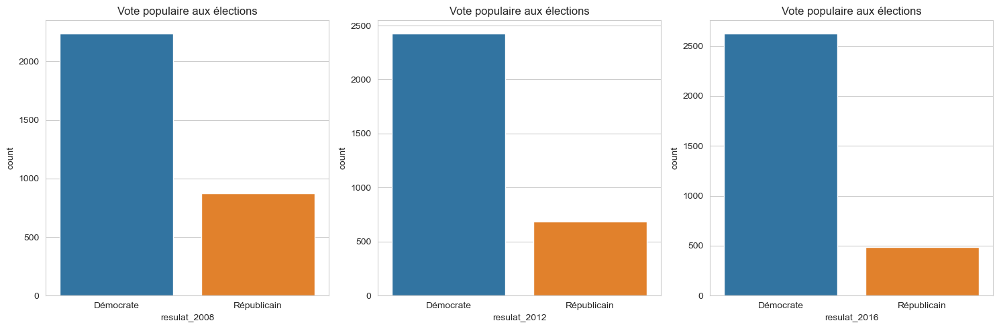

In [57]:
def plot_countplots(data):
    """
    Affiche les countplots de toutes les variables d'un DataFrame donné avec des grilles.

    Args:
        data (pandas.DataFrame): Le DataFrame contenant les variables à visualiser.
    """
    # Définir le style de grille
    sns.set_style("whitegrid")
    
    # Récupérer les noms de toutes les colonnes du DataFrame
    columns = data.columns

    # Calculer le nombre de lignes et de colonnes pour la disposition des subplots
    n_cols = 3  # Nombre de subplots par ligne
    n_rows = (len(columns) - 1) // n_cols + 1  # Calcul du nombre de lignes nécessaires

    # Créer la disposition des subplots
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))
    axes = axes.flatten()

    # Parcourir chaque colonne du DataFrame et tracer le countplot correspondant
    for i, col in enumerate(columns):
        ax = sns.countplot(data=data, x=col, ax=axes[i])
        ax.set_title("Vote populaire aux élections")
        
        # Définir les nouvelles étiquettes de l'axe des abscisses
        new_labels = ['Démocrate', 'Républicain']
        ax.set_xticklabels(new_labels)

    # Afficher les subplots
    plt.tight_layout()
    plt.show()

# Utilisation de la fonction pour afficher les countplots de toutes les variables
plot_countplots(historique_presidentielle)

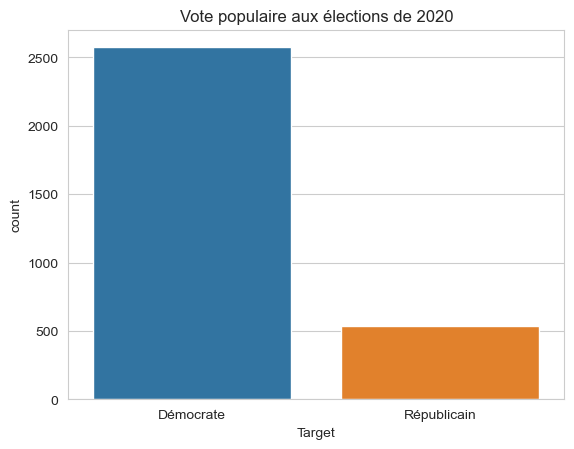

In [58]:
# Afficher le nombre de valeurs des catégories de la variable cible 
sns.countplot(data, x="Target")
plt.title("Vote populaire aux élections de 2020")

# Maintenant, modifions les étiquettes de l'axe des abscisses
n_categories = len(data['Target'].unique())  

# Définir les nouvelles étiquettes de l'axe des abscisses
new_labels = ['Démocrate', 'Républicain']

# Modifier les étiquettes de l'axe des abscisses
plt.xticks(range(n_categories), new_labels)

# Afficher à nouveau le graphique avec les nouvelles étiquettes
plt.show()

Le parti Démocrate a remporté le vote populaire aux élections présidentielles américaines de 2008, 2012 et 2020. En 2016, Hillary Clinton, la candidate Démocrate, a remporté le vote populaire mais a perdu l'élection face à Donald Trump.

# 

# 3. Modélisation

In [59]:
#Affichez les features
X.head()

,Civilian_labor_force_2017,Unemployment_rate_2014,"Percent of adults with a high school diploma only, 1970",2013 Urban Influence Code,"Percent of adults completing some college or associate's degree, 2000","Percent of adults completing some college (1-3 years), 1970","Percent of adults with a high school diploma only, 1990",R_DOMESTIC_MIG_2013,R_DOMESTIC_MIG_2011,R_NET_MIG_2016,R_NET_MIG_2014,R_NET_MIG_2015
0,26075.000,5.8,31.1,2.0,26.9,7.7,32.0,-4.121042,5.945455,4.777171,1.970443,-1.712875
1,71882.375,6.1,26.7,2.0,29.3,7.4,31.8,18.006050,15.684259,21.279291,20.115574,17.725964
2,8349.000,10.5,19.0,6.0,21.3,4.9,27.1,-7.762540,0.475598,-18.238016,-5.140431,-15.724575
3,8583.000,7.2,19.4,1.0,20.4,3.3,33.8,-6.683190,-5.436808,-0.708717,1.331144,1.329817
4,24822.000,6.1,22.7,1.0,24.8,4.1,34.7,-1.128482,0.487228,-1.391062,-2.049590,-1.338525


In [60]:
# affichez la target
y.value_counts(normalize=True)

Target
0.0    0.827121
1.0    0.172879
Name: proportion, dtype: float64

La variable cible est déséquilibrée. il faut gérer le désequilibre, dans notre cas on va surechantilloner notre classe minoritaire

In [61]:
# Divisez vos données en ensembles d'entraînement et de test
set_seed=1204
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=set_seed)

# Affichez les tailles des ensembles résultants
print("Taille de l'ensemble d'entraînement :", len(X_train))
print("Taille de l'ensemble de test :", len(X_test))

Taille de l'ensemble d'entraînement : 2489
Taille de l'ensemble de test : 623


In [62]:
# Fonction de suréchantillonnage de la classe minoritaire de mon dataset
def oversample_minority_class(X_train, y_train):
    # Concaténer X_train et y_train pour faciliter le suréchantillonnage
    train_data = pd.concat([X_train, y_train], axis=1)

    # Trouver la classe minoritaire
    class_counts = y_train.value_counts()
    minority_class_label = class_counts.idxmin()

    # Séparer les classes majoritaire et minoritaire
    majority_class = train_data[train_data[y_train.name] != minority_class_label]
    minority_class = train_data[train_data[y_train.name] == minority_class_label]

    # Déterminer le nombre d'échantillons de la classe majoritaire et minoritaire
    num_majority_samples = len(majority_class)
    num_minority_samples = len(minority_class)

    # Suréchantillonnage aléatoire de la classe minoritaire
    oversampled_minority = minority_class.sample(n=num_majority_samples, replace=True, random_state=set_seed)

    # Concaténer les échantillons suréchantillonnés avec les échantillons de la classe majoritaire
    oversampled_data = pd.concat([majority_class, oversampled_minority], axis=0)

    # Mélanger les données
    oversampled_data = oversampled_data.sample(frac=1, random_state=set_seed).reset_index(drop=True)

    # Séparer les features et les labels
    X_train_oversampled = oversampled_data.drop(columns=[y_train.name])
    y_train_oversampled = oversampled_data[y_train.name]

    return X_train_oversampled, y_train_oversampled

# Affichage des premières lignes du DataFrame avant suréchantillonnage
print("Avant suréchantillonnage:")
print(y_train.value_counts())

# Appliquer la fonction de suréchantillonnage
X_oversampled, y_oversampled = oversample_minority_class(X_train, y_train)

# Afficher les premières lignes du DataFrame suréchantillonné
print("\nAprès suréchantillonnage:")
print(y_oversampled.value_counts())

Avant suréchantillonnage:
Target
0.0    2056
1.0     433
Name: count, dtype: int64

Après suréchantillonnage:
Target
0.0    2056
1.0    2056
Name: count, dtype: int64


In [63]:
# Maintenant, divisez ensembles d'entraînement et de validation
X_train, X_val, y_train, y_val = train_test_split(X_oversampled, y_oversampled, test_size=0.2, random_state=set_seed)

In [64]:
# Affichez les tailles des ensembles résultants
print("Taille de l'ensemble d'entraînement :", len(X_train))
print("Taille de l'ensemble de validation :", len(X_val))
print("Taille de l'ensemble de test :", len(X_test))

Taille de l'ensemble d'entraînement : 3289
Taille de l'ensemble de validation : 823
Taille de l'ensemble de test : 623


In [65]:
# Définition des modèles
models = {
    "Logistic Regression": LogisticRegression(random_state=set_seed),
    "Linear SVM": SVC(kernel='linear', random_state=set_seed),
    "SVM with polynomial kernel": SVC(kernel='poly', random_state=set_seed),
    "Decision Tree": DecisionTreeClassifier(random_state=set_seed),
    "Random Forest": RandomForestClassifier(random_state=set_seed),
    "Gradient Boosting": GradientBoostingClassifier(random_state=set_seed)
}

# Initialisation de la pipeline pour chaque modèle
pipelines = {}
for name, model in models.items():
    pipelines[name] = Pipeline([
        ('scaler', StandardScaler()),  # Standardisation des features
        ('model', model)  # Modèle spécifique
    ])

# Entraînement et évaluation de chaque modèle
for name, pipeline in pipelines.items():
    print("Modèle :", name)
    # Entraînement du modèle
    pipeline.fit(X_train, y_train)
    # Prédiction sur l'ensemble de test
    y_pred = pipeline.predict(X_test)
    # Évaluation du modèle
    f1 = f1_score(y_test, y_pred, average="micro")
    print("Score F1 sur l'ensemble de test:", f1)
    print("\n")

Modèle : Logistic Regression
Score F1 sur l'ensemble de test: 0.7897271268057785


Modèle : Linear SVM
Score F1 sur l'ensemble de test: 0.8073836276083467


Modèle : SVM with polynomial kernel
Score F1 sur l'ensemble de test: 0.8459069020866774


Modèle : Decision Tree
Score F1 sur l'ensemble de test: 0.8426966292134831


Modèle : Random Forest
Score F1 sur l'ensemble de test: 0.8892455858747994


Modèle : Gradient Boosting
Score F1 sur l'ensemble de test: 0.8571428571428571




Les modèles les plus performants appartenant à différentes "familles" sont la régression logistique, le SVM avec noyau polynomial, la forêt aléatoire et le gradient boosting.

In [66]:
# Définition des grilles de recherche d'hyperparamètres pour chaque modèle
param_grids = {
    "Logistic Regression": {
        'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
        'classifier__penalty': ['l1', 'l2'],
    },
    "SVM with polynomial kernel": {
        'classifier__C': [0.001, 0.01, 0.1, 1, 10, 100],
        'classifier__degree': [2, 3, 4],
    },
    "Random Forest": {
        'classifier__n_estimators': [100, 200, 300],
        'classifier__max_depth': [None, 10, 20, 30],
    },
    "Gradient Boosting": {
        "classifier__n_estimators": [50, 100, 200, 500],
        'classifier__learning_rate': [0.01, 0.1, 1, 10],
    }
}

# Initialisation des modèles avec les pipelines
models_to_tune = {
    "Logistic Regression": Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', LogisticRegression(max_iter=1000, random_state=set_seed))
    ]),
    "SVM with polynomial kernel": Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', SVC(kernel="poly", random_state=set_seed))
    ]),
    "Random Forest": Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', RandomForestClassifier(random_state=set_seed))
    ]),
    "Gradient Boosting": Pipeline([
        ('scaler', StandardScaler()),
        ('classifier', GradientBoostingClassifier(random_state=set_seed))
    ])
}

# Recherche des meilleurs hyperparamètres pour chaque modèle
for model_name, model in models_to_tune.items():
    print(f"Tuning hyperparameters for {model_name}...")
    param_grid = param_grids[model_name]
    grid_search = GridSearchCV(model, param_grid, cv=5, n_jobs=1, scoring='f1_micro')
    grid_search.fit(X_val, y_val)
    print("Best parameters found:")
    print(grid_search.best_params_)
    print("Best score found:")
    print(grid_search.best_score_)
    print('\n')

Tuning hyperparameters for Logistic Regression...
Best parameters found:
{'classifier__C': 0.1, 'classifier__penalty': 'l2'}
Best score found:
0.80189948263119


Tuning hyperparameters for SVM with polynomial kernel...
Best parameters found:
{'classifier__C': 1, 'classifier__degree': 3}
Best score found:
0.8310790835181081


Tuning hyperparameters for Random Forest...
Best parameters found:
{'classifier__max_depth': None, 'classifier__n_estimators': 300}
Best score found:
0.8809386548410938


Tuning hyperparameters for Gradient Boosting...
Best parameters found:
{'classifier__learning_rate': 0.1, 'classifier__n_estimators': 500}
Best score found:
0.8736363636363637




Le meilleur modèle sur les données de validation est le Random Forest avec 0.8809386548410938

In [67]:
# Créer une pipeline pour utiliser les meilleurs hyperparamètres trouvés le Random Forest
pipeline_rf = Pipeline([
    ('scaler', StandardScaler()),  # Étape de standardisation
    ('random_forest', RandomForestClassifier(max_depth=None, n_estimators=300, random_state=set_seed))
])

# Fusionnez l'ensemble d'entraînement initial et l'ensemble de validation pour les features
X_train_full = pd.concat([X_train, X_val], axis=0, ignore_index=True)

# Fusionnez l'ensemble d'entraînement initial et l'ensemble de validation pour les labels
y_train_full = pd.concat([y_train, y_val], axis=0, ignore_index=True)

# Entraîner le modèle sur l'ensemble d'entraînement complet
pipeline_rf.fit(X_train_full, y_train_full)

# Prédire les étiquettes sur l'ensemble de test
y_pred_rf = pipeline_rf.predict(X_test)

# Évaluer les performances du modèle sur l'ensemble de test avec le score F1
f1_rf = f1_score(y_test, y_pred_rf, average="micro")

print("Score F1 sur l'ensemble de test avec Random Forest:", f1_rf)

# Afficher le rapport de classification
print("Rapport de classification :")
print(classification_report(y_test, y_pred_rf))

Score F1 sur l'ensemble de test avec Random Forest: 0.8892455858747994
Rapport de classification :
              precision    recall  f1-score   support

         0.0       0.91      0.96      0.94       518
         1.0       0.74      0.53      0.62       105

    accuracy                           0.89       623
   macro avg       0.82      0.75      0.78       623
weighted avg       0.88      0.89      0.88       623



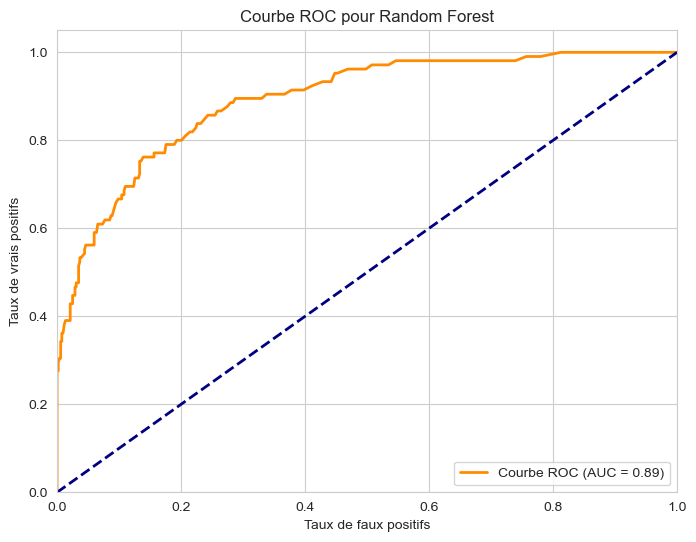

In [68]:
# Calcul des probabilités prédites pour la classe positive (classe 1)
y_score_rf = pipeline_rf.predict_proba(X_test)[:, 1]

# Calcul des taux de faux positifs (FPR) et des taux de vrais positifs (TPR) pour la courbe ROC
fpr_rf, tpr_rf, _ = roc_curve(y_test, y_score_rf)

# Calcul de l'aire sous la courbe ROC (AUC)
roc_auc_rf = auc(fpr_rf, tpr_rf)

# Tracé de la courbe ROC
plt.figure(figsize=(8, 6))
plt.plot(fpr_rf, tpr_rf, color='darkorange', lw=2, label='Courbe ROC (AUC = %0.2f)' % roc_auc_rf)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('Taux de faux positifs')
plt.ylabel('Taux de vrais positifs')
plt.title('Courbe ROC pour Random Forest')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()

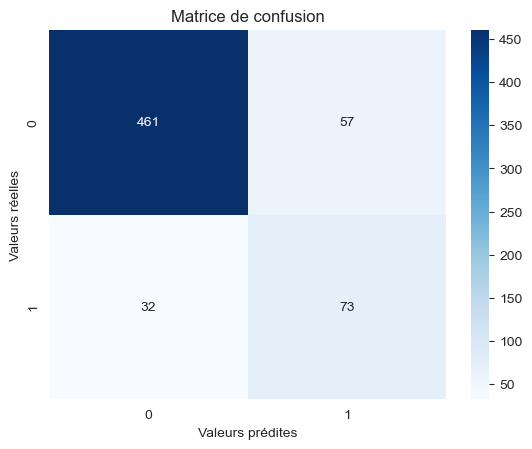

In [69]:
from sklearn.metrics import confusion_matrix

# Obtenir la matrice de confusion
conf_matrix = confusion_matrix(y_test, y_pred)

# Créer un heatmap avec Seaborn
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')

# Ajouter des étiquettes et un titre
plt.xlabel('Valeurs prédites')
plt.ylabel('Valeurs réelles')
plt.title('Matrice de confusion')

# Afficher le plot
plt.show()

# Analyse Globale des variables

In [70]:
# Calculer l'importance de permutation des variables pour le meilleur modèle
result = permutation_importance(pipeline, X_test, y_test, n_repeats=30, random_state=set_seed)

# Créer un DataFrame avec les variables et leurs importances de permutation
importance_df = pd.DataFrame({'Feature': X.columns, 'Importance': result.importances_mean})

# Trier le DataFrame par importance de permutation
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Réinitialiser les index du DataFrame
importance_df = importance_df.reset_index(drop=True)

# Afficher le DataFrame avec les variables et leurs importances de permutation
print(importance_df)

                                              Feature  Importance
0                           Civilian_labor_force_2017    0.054521
1   Percent of adults with a high school diploma o...    0.051953
2   Percent of adults completing some college (1-3...    0.029909
3   Percent of adults completing some college or a...    0.019048
4                           2013 Urban Influence Code    0.010219
5                              Unemployment_rate_2014    0.009470
6   Percent of adults with a high school diploma o...    0.006688
7                                      R_NET_MIG_2015    0.006421
8                                 R_DOMESTIC_MIG_2013    0.004869
9                                      R_NET_MIG_2014    0.004762
10                                R_DOMESTIC_MIG_2011    0.001445
11                                     R_NET_MIG_2016    0.000589


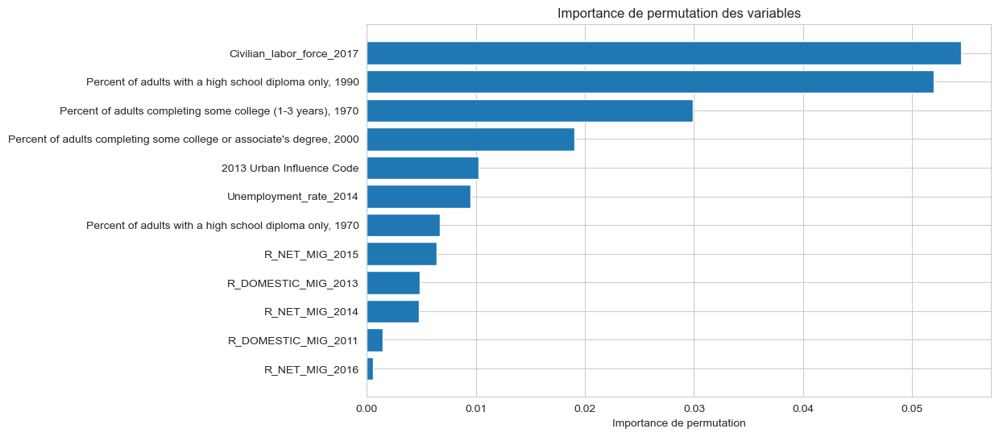

In [71]:
# Afficher les résultats
sorted_idx = result.importances_mean.argsort()
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_idx)), result.importances_mean[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), X.columns[sorted_idx])
plt.xlabel('Importance de permutation')
plt.title('Importance de permutation des variables')
plt.show()

Il s'agit des caractéristiques qui ont montré une contribution positive significative à la capacité prédictive du modèle logistique. 

# Analyse Locale des variables

In [72]:
 # Caractéristiques d'un exemple spécifique
i = 6 
X_test.values[i]

array([3756.        ,    9.2       ,   18.4       ,   12.        ,
         24.2       ,    8.        ,   31.7       ,   18.00604954,
         13.35543452,   24.23311774,   20.11557361,   18.11984212])

In [73]:
import shap

# Initialisation du Javascript
shap.initjs()

# Création de l'explainer SHAP
explainer_shap = shap.TreeExplainer(pipeline_rf.named_steps['random_forest'])

# Obtenir la valeur prédite du modèle
predicted_value = pipeline_rf.predict(X_test.values[i].reshape(1, -1))

# Afficher la valeur prédite du modèle
print("Valeur prédit0 e du modèle:", predicted_value[0])

# Obtenir les valeurs SHAP pour un exemple spécifique
shap_values = explainer_shap.shap_values(X_test.values[i])

# Afficher les valeurs SHAP
shap.force_plot(explainer_shap.expected_value[1], shap_values[1], feature_names=X_train_full.columns)


Valeur prédit0 e du modèle: 0.0


le modèle prédit le parti politique Démocrate vainqueur pour les caractéristique de l'index 6. On peut visualiser sur le graphique, sous la barre bleu les features qui ont influencés sa prédiction.

In [74]:
# import pickle
# # Sauvegarder le modèle
# with open('model/model.pkl', 'wb') as file:
#     pickle.dump(model, file)